# Access and visualization of EO Data on the Cloud

In this demonstration we will connect to an EO data catalog by using a [SpatioTemporal Asset Catalog (STAC)](https://stacspec.org/) client in Python. We will search for data products for a specific region and time period, display the boundaries of the available scenes, get an overview of the actual images, and display a high-resolution natural color composite image for a small region in the study area.

[Sentinel-2 Level-2A orthorectified atmospherically corrected surface reflectance](https://sentinel.esa.int/web/sentinel/missions/sentinel-2/data-products) dataset available at [AWS Open Data Portal](https://registry.opendata.aws/sentinel-2-l2a-cogs/) will be utilized. This dataset contains all of the scenes in the original Sentinel-2 Public Dataset, which are available from April 2017 over wider Europe region and globally since December 2018. Scenes are provided as [Cloud-Optimized GeoTIFFs](https://www.cogeo.org/).

You can find other data sources at [STAC Index](https://stacindex.org/).

The notebook is based on [odc-stac](https://odc-stac.readthedocs.io/en/latest/index.html) example notebook ["Access Sentinel 2 Data from AWS"](https://odc-stac.readthedocs.io/en/latest/notebooks/stac-load-e84-aws.html).

Please contact to [info@eoafrica-rd.org](mailto:info@eoafrica-rd.org) or [s.girgin@utwente.nl (Dr. Serkan Girgin)](mailto:s.girgin@utwente.nl) if you have any questions.

## Connect to the catalog and query available products

In [13]:
# Import Python library for working with STAC (https://github.com/stac-utils/pystac-client)
from pystac_client import Client

# Set study area (Bombetoka Bay, https://en.wikipedia.org/wiki/Bombetoka_Bay)
bbox = (46, -16, 46.5, -15.5)

# Set time period
time = ["2021-08-01", "2021-08-10"]

# Connect to the AWS Earth Search catalog
catalog = Client.open("https://earth-search.aws.element84.com/v0")

# Query datasets
query = catalog.search(
    collections=["sentinel-s2-l2a-cogs"],
    datetime=time,
    limit=100,
    bbox=bbox
)

# Display number of items found
items = list(query.get_items())
print(f"Found: {len(items):d} items")

Found: 4 items


In [14]:
# Display properties of the first item
items[0].properties

{'datetime': '2021-08-06T07:14:11Z',
 'platform': 'sentinel-2b',
 'constellation': 'sentinel-2',
 'instruments': ['msi'],
 'gsd': 10,
 'view:off_nadir': 0,
 'proj:epsg': 32738,
 'sentinel:utm_zone': 38,
 'sentinel:latitude_band': 'L',
 'sentinel:grid_square': 'NH',
 'sentinel:sequence': '0',
 'sentinel:product_id': 'S2B_MSIL2A_20210806T071159_N0301_R020_T38LNH_20210806T093506',
 'sentinel:data_coverage': 86.43,
 'eo:cloud_cover': 7.13,
 'sentinel:valid_cloud_cover': True,
 'created': '2021-08-06T12:35:43.441Z',
 'updated': '2021-08-06T12:35:43.441Z'}

## Display granules of the available items

<AxesSubplot:>

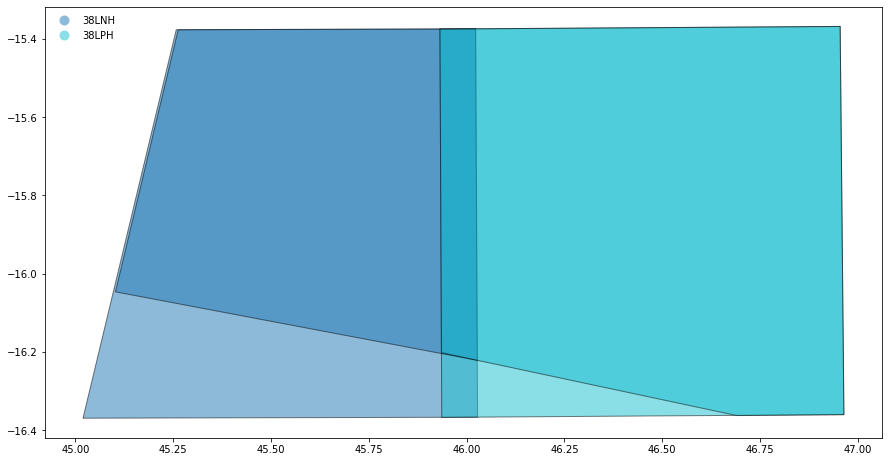

In [15]:
%%capture --no-display

# Import Geographic pandas extensions (https://geopandas.org)
import geopandas as gpd

# Create a geo-dataframe from the datasets (WGS84)
gdf = gpd.GeoDataFrame.from_features(query.get_all_items_as_dict(), "epsg:4326")

# Compute granule ids
gdf["granule"] = (
    gdf["sentinel:utm_zone"].apply(lambda x: f"{x:02d}")
    + gdf["sentinel:latitude_band"]
    + gdf["sentinel:grid_square"]
)

# Plot granules
fig = gdf.plot(
    "granule",
    edgecolor="black",
    categorical=True,
    aspect="equal",
    alpha=0.5,
    figsize=(15, 30),
    legend=True,
    legend_kwds={"loc": "upper left", "frameon": False, "ncol": 1},
)
fig

In [16]:
# Import mapping library (https://github.com/python-visualization/folium)
import folium
# Import geometric objects, predicates, and operations library (https://github.com/shapely/shapely)
import shapely.geometry

# Create map
map1 = folium.Map()

# Add study area to the map
folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=3, opacity=0.7, color="red"),
).add_to(map1)

# Add dataset granules to the map
gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "sentinel:data_coverage",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    m=map1,
)

# Zoom to the granules
bounds = gdf.unary_union.bounds
map1.fit_bounds(bounds=((bounds[1], bounds[0]), (bounds[3], bounds[2])))

# Display map
map1

## Load data

In [17]:
# Import tools for converting STAC metadata to ODC data model
from odc.stac import configure_rio, stac_load

# Set STAC configuration
cfg = {
    "sentinel-s2-l2a-cogs": {
        "assets": {
            "*": {
                "data_type": "uint16",
                "nodata": 0,
                "unit": "1",
            },
            "SCL": {
                "data_type": "uint8",
                "nodata": 0,
                "unit": "1",
            },
            "visual": {
                "data_type": "uint8",
                "nodata": 0,
                "unit": "1",
            },
        },
        "aliases": {
            "red": "B04",
            "green": "B03",
            "blue": "B02",
        }
    }
}

# Load* data (WGS 84 Pseudo-Mercator)
data = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs="epsg:3857",
    resolution=10 * 2**5,
    chunks={},
    stac_cfg=cfg,
)
data

<xarray.Dataset>
Dimensions:      (time: 4, y: 363, x: 677)
Coordinates:
  * time         (time) datetime64[ns] 2021-08-01T07:14:09 ... 2021-08-06T07:...
  * y            (y) float64 -1.732e+06 -1.732e+06 ... -1.847e+06 -1.848e+06
  * x            (x) float64 5.012e+06 5.012e+06 ... 5.228e+06 5.228e+06
    spatial_ref  int32 3857
Data variables:
    red          (time, y, x) uint16 dask.array<chunksize=(1, 363, 677), meta=np.ndarray>
    green        (time, y, x) uint16 dask.array<chunksize=(1, 363, 677), meta=np.ndarray>
    blue         (time, y, x) uint16 dask.array<chunksize=(1, 363, 677), meta=np.ndarray>
Attributes:
    crs:           epsg:3857
    grid_mapping:  spatial_ref

## Create natural-color composites

In [18]:
%%time
# Load miscellaneous algorithmic helper methods
from odc.algo import to_rgba

# Generate* natural-color composite image
rgba = to_rgba(data, clamp=(1, 3000)).compute()

CPU times: user 844 ms, sys: 44 ms, total: 888 ms
Wall time: 339 ms


## Display natural-color composites

In [19]:
# Create map
map2 = folium.Map()

# Add study area to the map
folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=3, opacity=0.7, color="red"),
    name="Study Area",
).add_to(map2)

# Add dataset granules to the map
gdf.explore(
    "granule",
    categorical=True,
    tooltip=False,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="Granules",
    m=map2,
)

# Get geographic extent of the images
extent = rgba.geobox.geographic_extent.boundingbox
bounds = ((extent[3], extent[0]), (extent[1], extent[2]))

# Add images 
for i in range(rgba.coords["time"].size):
    folium.raster_layers.ImageOverlay(
        rgba.isel(time=i).data, bounds=bounds, name="Image {}".format(i + 1)
    ).add_to(map2)

# Add layer control
folium.LayerControl().add_to(map2)

# Zoom to the images
map2.fit_bounds(bounds=bounds)

# Display map
map2

## Load high-resolution data

In [20]:
# Set smaller study area
small_bbox = (46.25, -16.00, 46.40, -15.85)

# Load data
small_data = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs="epsg:3857",
    resolution=10,
    chunks={},
    groupby="solar_day",
    stac_cfg=cfg,
    bbox=small_bbox,
)

In [21]:
%%time
small_rgba = to_rgba(small_data, clamp=(1, 3000)).compute()
small_rgba.coords

CPU times: user 1.87 s, sys: 196 ms, total: 2.07 s
Wall time: 3.53 s


Coordinates:
  * time         (time) datetime64[ns] 2021-08-01T07:14:09 2021-08-06T07:14:08
  * y            (y) float64 -1.787e+06 -1.787e+06 ... -1.805e+06 -1.805e+06
  * x            (x) float64 5.149e+06 5.149e+06 ... 5.165e+06 5.165e+06
    spatial_ref  int32 3857
  * band         (band) <U1 'r' 'g' 'b' 'a'

## Display high-resolution data

In [22]:
# Import notebook display helper methods
import odc.ui
from IPython.display import HTML

# Generate JPEG image of the first image
img = odc.ui.mk_data_uri(odc.ui.to_jpeg_data(small_rgba.isel(time=0).data))

# Display image
HTML(data=f"""<img src="{img}" width='50%'>""")

In [23]:
# Display first two images side by side
img_a = odc.ui.mk_data_uri(odc.ui.to_jpeg_data(small_rgba.isel(time=0).data))
img_b = odc.ui.mk_data_uri(odc.ui.to_jpeg_data(small_rgba.isel(time=1).data))

HTML(data=f"""<img src="{img_a}" style="width:50%; float: left"><img src="{img_b}" style="width:50%; float: left">""")

## Save as GeoTIFF

In [24]:
# Import rasterio xarray extension
import rioxarray

# Save low-resolution images
for i in range(rgba.coords["time"].size):
    rgba.isel(time=i).transpose('band', 'y', 'x').rio.to_raster("RGB_{}.tif".format(i))

# Save high-resolution images
for i in range(small_rgba.coords["time"].size):
    small_rgba.isel(time=i).transpose('band', 'y', 'x').rio.to_raster("RGB_Small_{}.tif".format(i))